# Проект E-commerce "SuperFood"

# 1 - Цели проекта:
---
**Средствами Python:**
> **1) Провести первичный анализ данных на предмет чистоты (Избавиться от дуликатов \ выбросов \ по необходимости добавить расчетные столбцы)**
> 
> **2) Проследить динамику продаж за весь период с разбивкой по топ-5 городам и рассмотреть популярные категории товаров (выявить тренды)**
> 
> **3) Выгрузить итоговый датафрейм в базу данных (Postgress\SQLite)**

**Средствами SQL:**
> **1) По итоговому датафрейму провести RFM-анализ для двух последних лет с разбивкой клиентов на 4 сегмента (Лояльные клиенты \ Новые клиенты \ Спящие клиенты \ Потерянные клиенты)**

**Средствами BI системы Datalens:**
> **1)Построить интерактивный аналитический дашборд**

# 2 - Описание данных полученных от заказчика

Колонки в полученном от заказчика датасете `superstore.csv:`

- `Row ID ` — номер строки;
- `Order ID` — идентификатор заказа ;
- `Order Date` — дата заказа;
- `Ship Date` — дата доставки;
- `Ship Mode` — тип доставки;
- `Customer ID` — идентификатор покупателя;
- `Customer Name` — фио покупателя;
- `Segment` — потребительский сегмент;
- `Country` — страна покупателя;
- `City` — город покупателя
- `State` — штат покупателя;
- `Postal Code` — почтовый код покупателя;
- `Region` — регион покупателя;
- `Product ID` — идентификатор товара;
- `Category` — категория товара;
- `Sub-Category` — подкатегория;
- `Product Name` — наименование товара;
- `Sales` — стоимость товара в $.

# 3 - Предобработка данных и первичный EDA

In [1]:
# Импортируем библиотеки для работы
import pandas as pd
import seaborn as sns
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from plotly.offline import iplot
import gdown #загрузка файлов с гугла
from qgrid import show_grid #интерактивный датафрейм с настройками show_grid(your_df)
from ydata_profiling import ProfileReport
import sqlite3

In [2]:
# Загружаем файл с Google Диска
try:
    df = pd.read_csv('superstore.csv')
except:
    url = 'https://drive.google.com/uc?id=1LWfsSdCjCeXg1dWeeQ7PYmTjVq-fxNX2'  
    output = 'superstore.csv'  

    gdown.download(url, output, quiet=False)

    df = pd.read_csv(output)

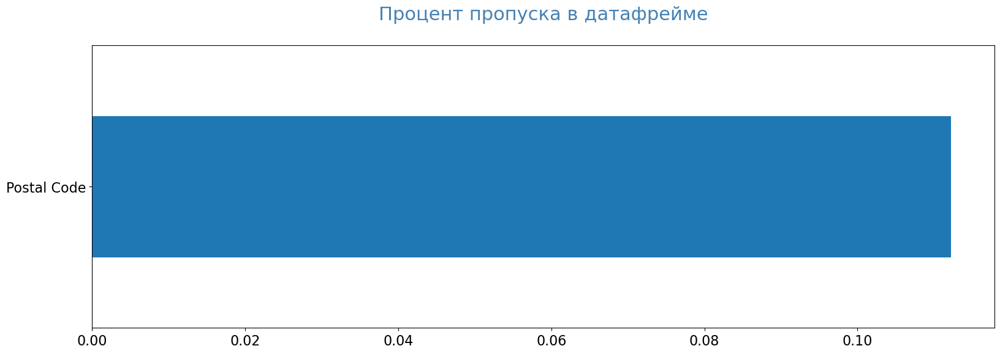

In [3]:
def pass_value_barh(df):
    try:
        (
            (df.isna().mean()*100)
            .to_frame()
            .rename(columns = {0:'space'})
            .query('space > 0')
            .sort_values(by = 'space', ascending = True)
            .plot(kind = 'barh', figsize = (19,6), rot = 0, legend = False, fontsize = 16)
            .set_title('Процент пропуска в датафрейме' + "\n", fontsize = 22, color = 'SteelBlue')    
        );    
    except:
        print('пропусков не осталось :) ')
pass_value_barh(df)

___Пропуски в данных наблюдаем только в столбце Postal Code (процент невелик и в анализе этот столбец нам не важен)___

In [4]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Вопиющих аномалий не выявленно, стоит проработать типы данных в таблице и формат имен столбцов привести к одному виду а так же создать столбцы с месяцем и годом отдельно**

In [5]:
df = df.rename(str.lower, axis='columns')
df = df.rename(columns={"sub-category": "sub category"})
df = df.rename(columns=lambda x: x.replace(' ', '_'))
df['sales'] = df['sales'].astype('float').round(2)

In [6]:
df['order_date'] = pd.to_datetime(df['order_date'], format='%d/%m/%Y')
df['ship_date'] = pd.to_datetime(df['ship_date'], format='%d/%m/%Y')

In [7]:
#df['order_date'] = df['order_date'].dt.strftime('%d-%m-%Y')
#df['ship_date'] = df['ship_date'].dt.strftime('%d-%m-%Y')

In [8]:
df = df[['customer_id','customer_name','order_id','product_id','product_name','category','sub_category','order_date','ship_date','ship_mode','segment','region','state','city','sales']]

In [9]:
df['order_month'] = df['order_date'].dt.month
df['order_year'] = df['order_date'].dt.year

In [10]:
show_grid(df)

QgridWidget(grid_options={'fullWidthRows': True, 'syncColumnCellResize': True, 'forceFitColumns': True, 'defau…

# 4 - Анализ потребительского поведения:

## 1 - Определим Топ-5 городов по сумме продаж в пяти самых прибыльных штатах, за весь период

In [11]:
state_sales = df.groupby('state')['sales'].sum().sort_values(ascending=False)

# Выбрать топ 5 штатов с наибольшей выручкой
top_states = state_sales.nlargest(5).index

# Создать пустой DataFrame для хранения топ 5 городов 
top_cities_df = pd.DataFrame(columns=['state', 'city', 'sales'])

# Для каждого из выбранных штатов сгруппировать данные по городам и выбрать топ 5 городов с наибольшей выручкой
for state in top_states:
    state_df = df[df['state'] == state]
    city_sales = state_df.groupby('city')['sales'].sum().nlargest(5).reset_index()
    city_sales['state'] = state
    top_cities_df = pd.concat([top_cities_df, city_sales])
print(top_cities_df)

          state           city      sales
0    California    Los Angeles  173420.14
1    California  San Francisco  109041.09
2    California      San Diego   47521.05
3    California         Fresno    7888.53
4    California     Sacramento    7311.26
0      New York  New York City  252462.50
1      New York        Buffalo    9063.50
2      New York     Long Beach    8434.09
3      New York        Yonkers    7657.67
4      New York      Rochester    6017.13
0         Texas        Houston   63956.08
1         Texas    San Antonio   21843.53
2         Texas         Dallas   20127.90
3         Texas     Huntsville    6710.61
4         Texas     Fort Worth    6602.69
0    Washington        Seattle  116106.32
1    Washington     Bellingham    3790.24
2    Washington     Des Moines    3454.44
3    Washington        Edmonds    2523.69
4    Washington          Pasco    2201.11
0  Pennsylvania   Philadelphia  108841.79
1  Pennsylvania        Chester    1968.50
2  Pennsylvania      Bethlehem    

C:\Users\Timofey\AppData\Local\Temp\ipykernel_13308\1571623497.py:14: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



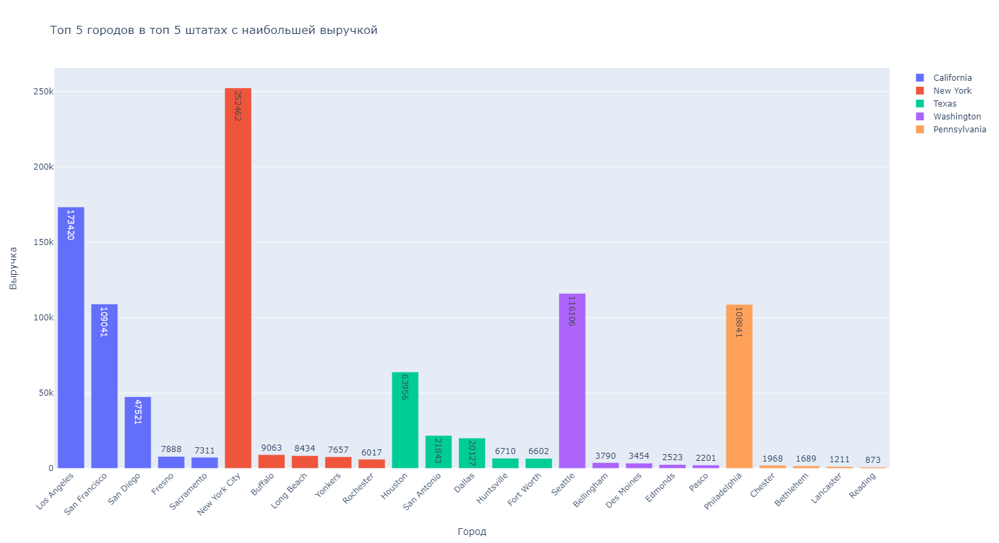

In [12]:
top_cities_df['sales'] = top_cities_df['sales'].astype(int)
fig = go.Figure()

# Добавление столбцов для каждого города в каждом штате
for state in top_states:
    state_data = top_cities_df[top_cities_df['state'] == state]
    fig.add_trace(go.Bar(x=state_data['city'], y=state_data['sales'], name=state, text=state_data['sales'], textposition='auto'))

# Настройка макета
fig.update_layout(barmode='group', xaxis_tickangle=-45, 
                  title='Топ 5 городов в топ 5 штатах с наибольшей выручкой',
                  xaxis_title='Город', yaxis_title='Выручка',height=800, width=1100)

# Отображение графика
fig.show()


## 2 - Рассмотрим как менялась выручка в самых прибыльных городах пяти штатов за последние два года и сравним разницу между ними

In [13]:
# Подготовим срезы данных
df_2017 =  df.query('(city == "Los Angeles" or city == "New York City" or city == "Houston" or city == "Seattle" or city == "Philadelphia") and order_year == 2017')
df_2018 = df.query('(city == "Los Angeles" or city == "New York City" or city == "Houston" or city == "Seattle" or city == "Philadelphia") and order_year == 2018')


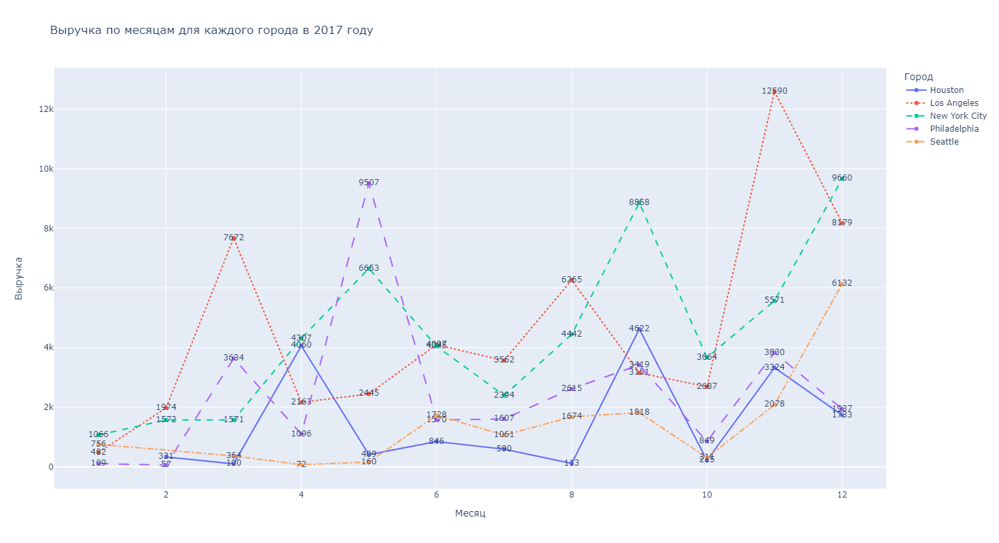

In [14]:
sales_city_month = df_2017.groupby(['city', 'order_month'])['sales'].sum().reset_index()
sales_city_month['sales'] = sales_city_month['sales'].astype(int)
fig = px.line(sales_city_month, x='order_month', y='sales', color='city',text='sales',
              title='Выручка по месяцам для каждого города в 2017 году',
              labels={'order_month': 'Месяц', 'sales': 'Выручка', 'city': 'Город'},height=800, width=1100, line_dash='city')
fig.show()

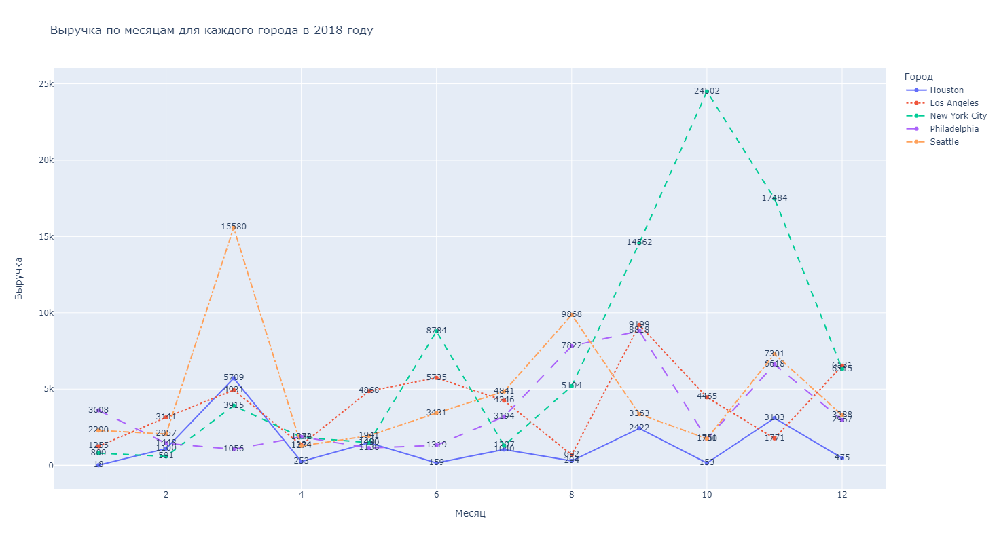

In [15]:
sales_city_month_2 = df_2018.groupby(['city', 'order_month'])['sales'].sum().reset_index()
sales_city_month_2['sales'] = sales_city_month_2['sales'].astype(int)
fig = px.line(sales_city_month_2, x='order_month', y='sales', color='city',text='sales',
              title='Выручка по месяцам для каждого города в 2018 году',
              labels={'order_month': 'Месяц', 'sales': 'Выручка', 'city': 'Город'},height=800, width=1100, line_dash='city')
fig.show()

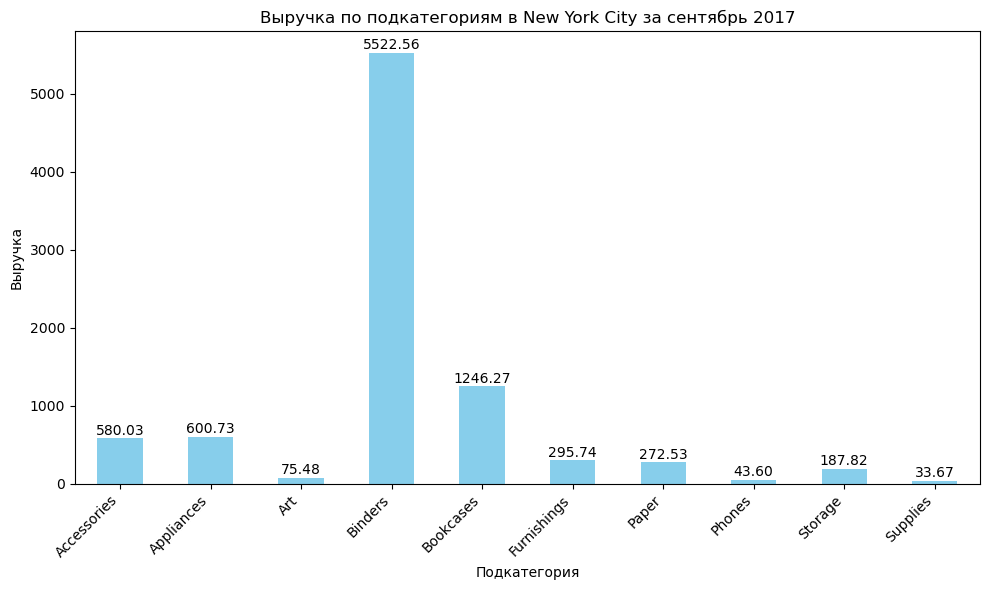

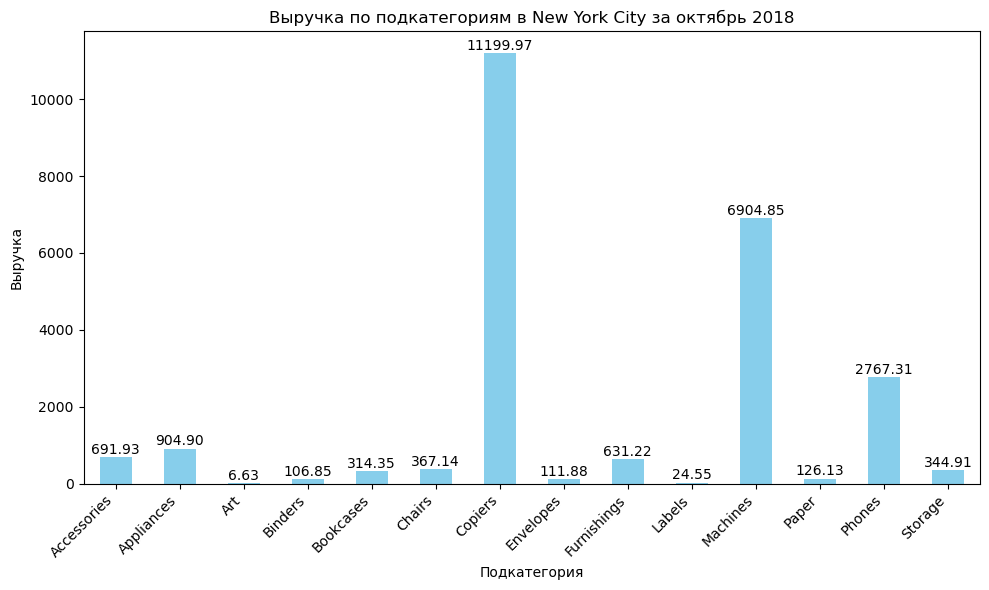

In [16]:
sales_nyc_month_9 = df_2017.query("city == 'New York City' and order_month == 9")

# Группировка данных по подкатегории и вычисление суммы выручки
revenue_by_subcategory_9 = sales_nyc_month_9.groupby('sub_category')['sales'].sum()

# Построение барчарта
plt.figure(figsize=(10, 6))
revenue_by_subcategory_9.plot(kind='bar', color='skyblue')
plt.title('Выручка по подкатегориям в New York City за сентябрь 2017')
plt.xlabel('Подкатегория')
plt.ylabel('Выручка')
plt.xticks(rotation=45, ha='right')  # Поворот подписей на оси x для лучшей читаемости
# Добавление подписей над столбцами
for i, value in enumerate(revenue_by_subcategory_9):
    plt.text(i, value + 10, f'{value:.2f}', ha='center', va='bottom')
plt.tight_layout()
plt.show()


# Фильтрация данных по городу New York City и месяцу 10 с использованием query
sales_nyc_month_10 = df_2018.query("city == 'New York City' and order_month == 10")

# Группировка данных по подкатегории и вычисление суммы выручки
revenue_by_subcategory_10 = sales_nyc_month_10.groupby('sub_category')['sales'].sum()

# Построение барчарта
plt.figure(figsize=(10, 6))
revenue_by_subcategory_10.plot(kind='bar', color='skyblue')
plt.title('Выручка по подкатегориям в New York City за октябрь 2018')
plt.xlabel('Подкатегория')
plt.ylabel('Выручка')
plt.xticks(rotation=45, ha='right')  # Поворот подписей на оси x для лучшей читаемости
# Добавление подписей над столбцами
for i, value in enumerate(revenue_by_subcategory_10):
    plt.text(i, value + 10, f'{value:.2f}', ha='center', va='bottom')
plt.tight_layout()
plt.show()


In [17]:
df_2017['category'].unique()

array(['Office Supplies', 'Technology', 'Furniture'], dtype=object)

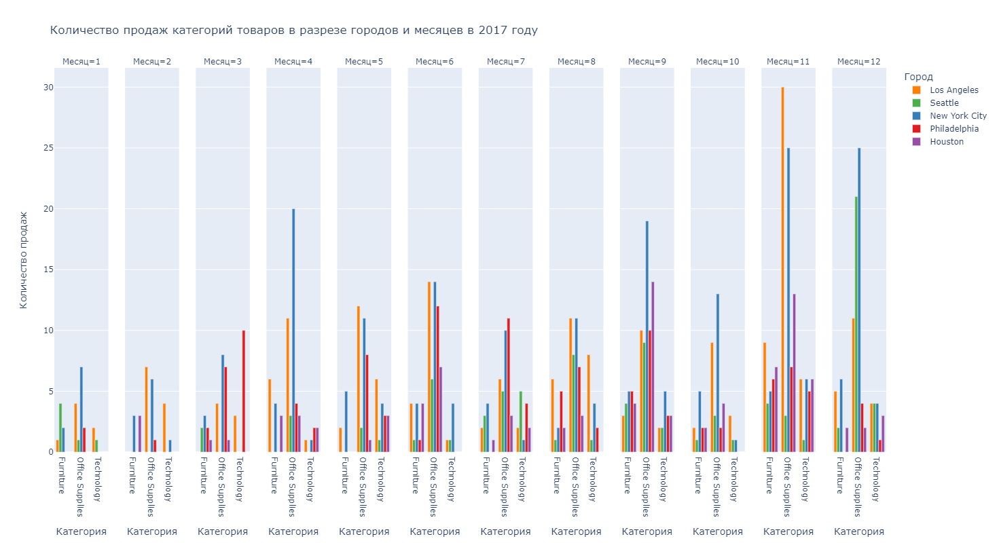

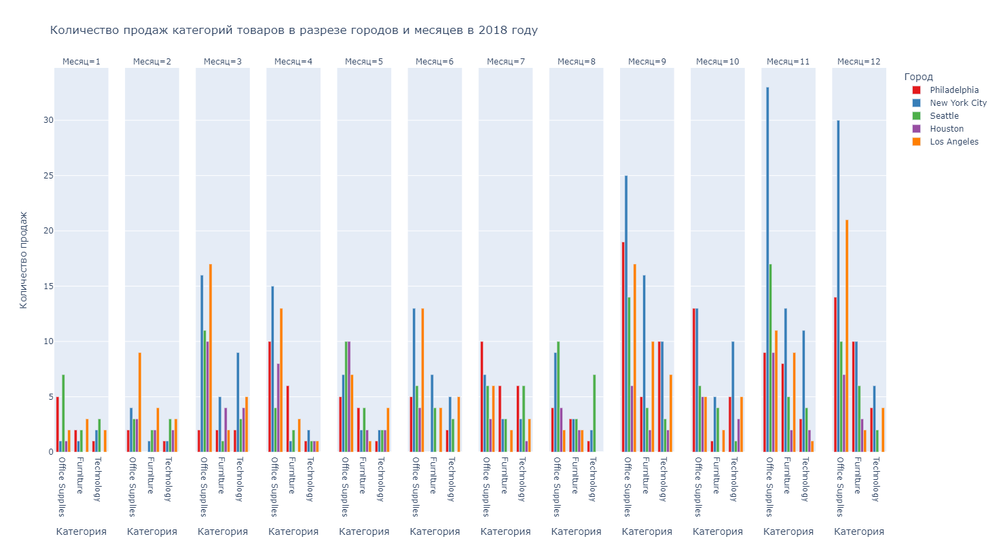

In [18]:
# Группировка данных и подсчет количества продаж по категориям, городам и месяцам для 2017 и 2018
sales_category_city_month = df_2017.groupby(['category', 'city', 'order_month'])['order_id'].count().reset_index()

sales_category_city_month_2 = df_2018.groupby(['category', 'city', 'order_month'])['order_id'].count().reset_index()

# Сортировка данных по месяцам
sales_category_city_month_sorted = sales_category_city_month.sort_values(by='order_month')
# Сортировка данных по месяцам
sales_category_city_month_sorted_2 = sales_category_city_month_2.sort_values(by='order_month')

# Генерация цветовой палитры для городов
city_palette = px.colors.qualitative.Set1[:len(sales_category_city_month_sorted_2['city'].unique())]
city_color_map = dict(zip(sales_category_city_month_sorted_2['city'].unique(), city_palette))

# Построение столбчатой диаграммы для 2017 года
fig_2017 = px.bar(sales_category_city_month_sorted, x='category', y='order_id', color='city', facet_col='order_month',
                   title='Количество продаж категорий товаров в разрезе городов и месяцев в 2017 году',
                   labels={'category': 'Категория', 'order_id': 'Количество продаж', 'city': 'Город', 'order_month': 'Месяц'},
                   height=800, width=1150, barmode='group', color_discrete_map=city_color_map)

fig_2017.update_layout(coloraxis_showscale=False)  

fig_2017.show()

# Построение столбчатой диаграммы для 2018 года
fig_2018 = px.bar(sales_category_city_month_sorted_2, x='category', y='order_id', color='city', facet_col='order_month',
                   title='Количество продаж категорий товаров в разрезе городов и месяцев в 2018 году',
                   labels={'category': 'Категория', 'order_id': 'Количество продаж', 'city': 'Город', 'order_month': 'Месяц'},
                   height=800, width=1150, barmode='group', color_discrete_map=city_color_map)

fig_2018.update_layout(coloraxis_showscale=False) 

fig_2018.show()


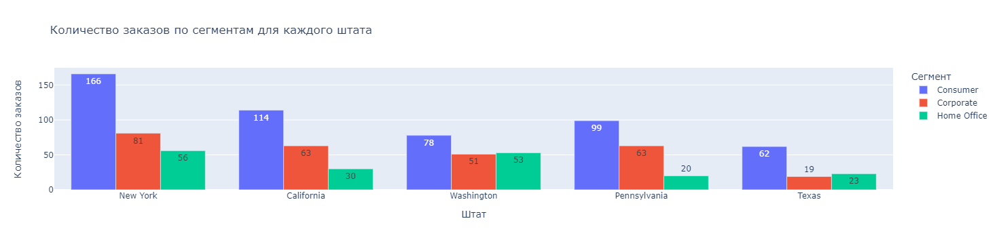

In [19]:
orders_by_state_segment = df_2018.groupby(['state', 'segment']).size().reset_index(name='count')

# Построение столбчатой диаграммы
fig = px.bar(orders_by_state_segment, x='state', y='count', color='segment', text='count',
             title='Количество заказов по сегментам для каждого штата',
             labels={'state': 'Штат', 'count': 'Количество заказов', 'segment': 'Сегмент'},
             barmode='group')

fig.update_layout(xaxis={'categoryorder':'total descending'}) # сортировка штатов по убыванию количества заказов
fig.show()

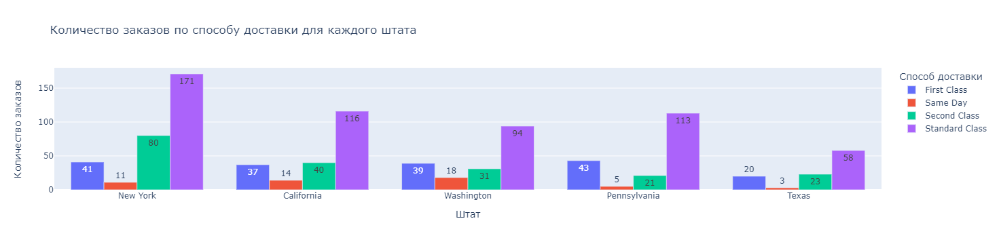

In [20]:
orders_by_state_ship_mode = df_2018.groupby(['state', 'ship_mode']).size().reset_index(name='count')

# Построение столбчатой диаграммы
fig = px.bar(orders_by_state_ship_mode, x='state', y='count', color='ship_mode', text='count',
             title='Количество заказов по способу доставки для каждого штата',
             labels={'state': 'Штат', 'count': 'Количество заказов', 'ship_mode': 'Способ доставки'},
             barmode='group')

fig.update_layout(xaxis={'categoryorder': 'total descending'}) 
fig.show()


## 3 - Разделим набор данных на 2017 и 2018 год для проведения сравнительного RFM анализа с помощью SQL в СУБД DBeaver

In [21]:
df_2017 = df.query('order_year == 2017')

In [22]:
df_2018 = df.query('order_year == 2018')

In [23]:
df_2017['customer_id'].nunique()

635

In [24]:
df_2018['customer_id'].nunique()

690

In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9800 entries, 0 to 9799
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   customer_id    9800 non-null   object        
 1   customer_name  9800 non-null   object        
 2   order_id       9800 non-null   object        
 3   product_id     9800 non-null   object        
 4   product_name   9800 non-null   object        
 5   category       9800 non-null   object        
 6   sub_category   9800 non-null   object        
 7   order_date     9800 non-null   datetime64[ns]
 8   ship_date      9800 non-null   datetime64[ns]
 9   ship_mode      9800 non-null   object        
 10  segment        9800 non-null   object        
 11  region         9800 non-null   object        
 12  state          9800 non-null   object        
 13  city           9800 non-null   object        
 14  sales          9800 non-null   float64       
 15  order_month    9800 n

## 4 - Выгрузим наши датафреймы в SQLite и продолжим рассчеты там

In [26]:
conn = sqlite3.connect('C:\\Users\\Timofey\\LerningDA\\Data_Study\\New_VeR\\superstore_Sqlite.db') #Указываем свое расположение рабочей папки
df_2017.to_sql('df_2017', conn, if_exists='replace', index=False)
conn.close()

In [27]:
conn = sqlite3.connect('C:\\Users\\Timofey\\LerningDA\\Data_Study\\New_VeR\\superstore_Sqlite.db') #Указываем свое расположение рабочей папки
df_2018.to_sql('df_2018', conn, if_exists='replace', index=False)
conn.close()

# 5 - Проверка на синтетические данные

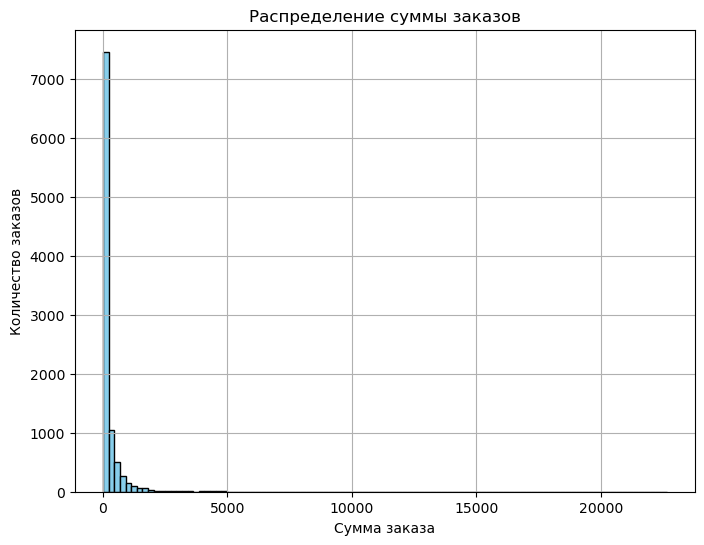

In [28]:
plt.figure(figsize=(8, 6))
plt.hist(df['sales'], bins=100, color='skyblue', edgecolor='black')
plt.title('Распределение суммы заказов')
plt.xlabel('Сумма заказа')
plt.ylabel('Количество заказов')
plt.grid(True)
plt.show()

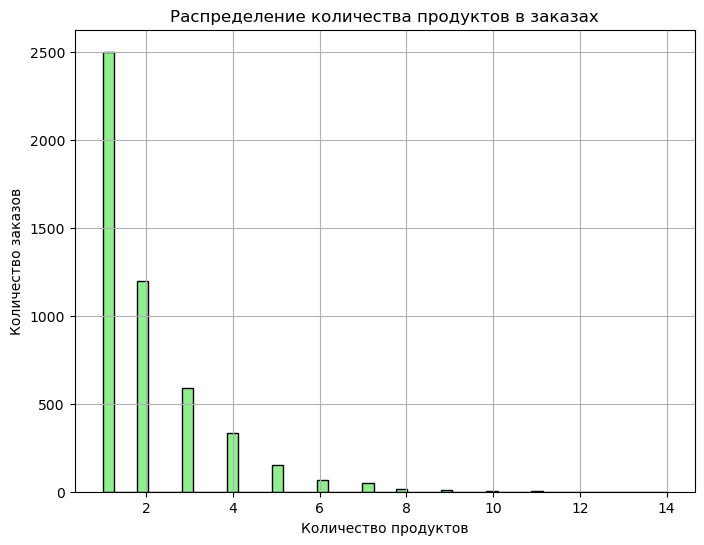

In [29]:
product_counts = df.groupby('order_id')['product_id'].count()

# Построение гистограммы для распределения количества продуктов в заказах
plt.figure(figsize=(8, 6))
plt.hist(product_counts, bins=50, color='lightgreen', edgecolor='black')
plt.title('Распределение количества продуктов в заказах')
plt.xlabel('Количество продуктов')
plt.ylabel('Количество заказов')
plt.grid(True)
plt.show()

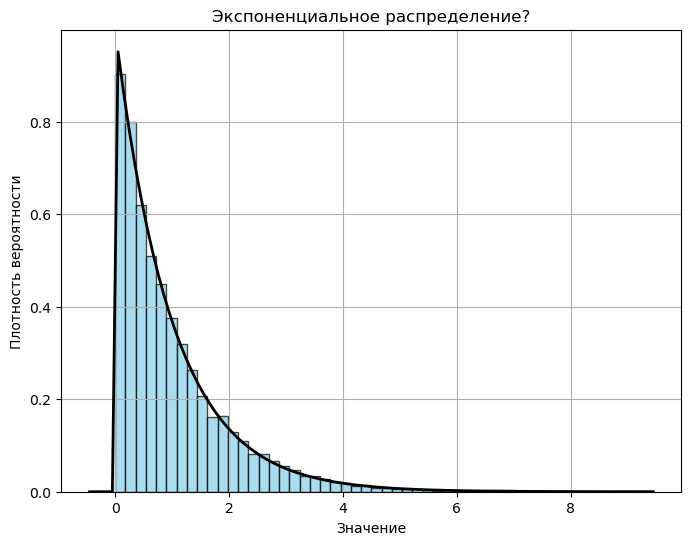

In [30]:
from scipy.stats import expon

# Параметры распределения
scale_param = 1  # Масштабный параметр, который влияет на "скорость спада" распределения

# Генерация случайных чисел с экспоненциальным распределением
sample_size = 10000
data = np.random.exponential(scale=scale_param, size=sample_size)

# Построение гистограммы и плотности экспоненциального распределения
plt.figure(figsize=(8, 6))
plt.hist(data, bins=50, density=True, color='skyblue', alpha=0.7, edgecolor='black')

# Вычисление плотности вероятности экспоненциального распределения
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = expon.pdf(x, scale=scale_param)
plt.plot(x, p, 'k', linewidth=2)

plt.title('Экспоненциальное распределение?')
plt.xlabel('Значение')
plt.ylabel('Плотность вероятности')
plt.grid(True)
plt.show()
